In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
%matplotlib inline
import os

import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson
%matplotlib inline

from pandas import read_csv
from pandas.plotting import scatter_matrix
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [2]:
Covid19=pd.read_csv("Bing-COVID19-Data.csv")

C:\Users\RAGHUNATH GANESAN\Anaconda\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
Covid19.describe()

,ID,Confirmed,ConfirmedChange,Deaths,DeathsChange,Recovered,RecoveredChange,Latitude,Longitude
count,3.356520e+06,3.356520e+06,3.351006e+06,3.268391e+06,3.257378e+06,1.032358e+06,1.022860e+06,3.355778e+06,3.355778e+06
mean,1.126182e+08,8.939569e+04,3.791809e+02,1.759707e+03,3.846591e+00,8.127296e+04,3.208513e+02,3.462494e+01,-4.927259e+01
std,5.297027e+07,2.674155e+06,1.674950e+04,4.937160e+04,5.899125e+02,1.103846e+06,2.979988e+04,1.486877e+01,7.030916e+01
min,1.900000e+01,0.000000e+00,-7.267002e+06,-1.000000e+00,-6.155880e+05,0.000000e+00,-2.477651e+07,-8.020264e+01,-1.762045e+02
25%,6.942389e+07,5.400000e+02,1.000000e+00,8.000000e+00,0.000000e+00,1.170000e+02,0.000000e+00,3.127606e+01,-9.378569e+01
50%,1.240989e+08,2.704000e+03,6.000000e+00,4.700000e+01,0.000000e+00,1.910000e+03,1.000000e+00,3.737848e+01,-8.356035e+01
75%,1.592007e+08,1.144400e+04,3.300000e+01,1.870000e+02,0.000000e+00,1.534200e+04,2.400000e+01,4.254530e+01,7.624550e+00
max,1.842689e+08,4.681331e+08,8.401564e+06,6.070849e+06,1.306400e+05,9.589726e+07,1.282071e+07,7.869540e+01,1.779633e+02


In [4]:
Covid19.head()

,ID,Updated,Confirmed,ConfirmedChange,Deaths,DeathsChange,Recovered,RecoveredChange,Latitude,Longitude,ISO2,ISO3,Country_Region,AdminRegion1,AdminRegion2
0,338995,01/21/2020,262,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Worldwide,NaN,NaN
1,338996,01/22/2020,313,51.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Worldwide,NaN,NaN
2,338997,01/23/2020,578,265.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Worldwide,NaN,NaN
3,338998,01/24/2020,841,263.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Worldwide,NaN,NaN
4,338999,01/25/2020,1320,479.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Worldwide,NaN,NaN


In [5]:
Covid19.tail()

,ID,Updated,Confirmed,ConfirmedChange,Deaths,DeathsChange,Recovered,RecoveredChange,Latitude,Longitude,ISO2,ISO3,Country_Region,AdminRegion1,AdminRegion2
3356515,183546147,03/17/2022,865,0.0,0.0,0.0,NaN,NaN,-18.99976,29.29671,ZW,ZWE,Zimbabwe,MI,Kwekwe
3356516,183680606,03/18/2022,865,0.0,0.0,0.0,NaN,NaN,-18.99976,29.29671,ZW,ZWE,Zimbabwe,MI,Kwekwe
3356517,183819828,03/19/2022,865,0.0,0.0,0.0,NaN,NaN,-18.99976,29.29671,ZW,ZWE,Zimbabwe,MI,Kwekwe
3356518,183960766,03/20/2022,865,0.0,0.0,0.0,NaN,NaN,-18.99976,29.29671,ZW,ZWE,Zimbabwe,MI,Kwekwe
3356519,184105198,03/21/2022,865,0.0,0.0,0.0,NaN,NaN,-18.99976,29.29671,ZW,ZWE,Zimbabwe,MI,Kwekwe


In [6]:
Covid19.corr()

,ID,Confirmed,ConfirmedChange,Deaths,DeathsChange,Recovered,RecoveredChange,Latitude,Longitude
ID,1.000000,0.024831,0.012627,0.021852,-0.001189,0.050168,0.001402,0.044084,-0.008427
Confirmed,0.024831,1.000000,0.682856,0.976191,0.176809,0.962125,0.173453,-0.030896,0.036876
ConfirmedChange,0.012627,0.682856,1.000000,0.642650,0.166741,0.731960,0.177630,-0.004678,0.016610
Deaths,0.021852,0.976191,0.642650,1.000000,0.191003,0.914704,0.172514,-0.056225,0.033700
DeathsChange,-0.001189,0.176809,0.166741,0.191003,1.000000,0.138361,0.036527,0.000930,-0.001151
Recovered,0.050168,0.962125,0.731960,0.914704,0.138361,1.000000,0.186860,-0.034493,0.016891
RecoveredChange,0.001402,0.173453,0.177630,0.172514,0.036527,0.186860,1.000000,-0.007905,0.004625
Latitude,0.044084,-0.030896,-0.004678,-0.056225,0.000930,-0.034493,-0.007905,1.000000,-0.194519
Longitude,-0.008427,0.036876,0.016610,0.033700,-0.001151,0.016891,0.004625,-0.194519,1.000000


In [7]:
Covid19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3356520 entries, 0 to 3356519
Data columns (total 15 columns):
 #   Column           Dtype  
---  ------           -----  
 0   ID               int64  
 1   Updated          object 
 2   Confirmed        int64  
 3   ConfirmedChange  float64
 4   Deaths           float64
 5   DeathsChange     float64
 6   Recovered        float64
 7   RecoveredChange  float64
 8   Latitude         float64
 9   Longitude        float64
 10  ISO2             object 
 11  ISO3             object 
 12  Country_Region   object 
 13  AdminRegion1     object 
 14  AdminRegion2     object 
dtypes: float64(7), int64(2), object(6)
memory usage: 384.1+ MB


<Figure size 1080x576 with 0 Axes>

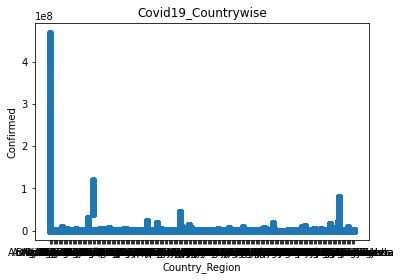

<Figure size 1080x576 with 0 Axes>

In [8]:
plt.scatter(x=Covid19['Country_Region'],y=Covid19['Confirmed'])
plt.title("Covid19_Countrywise")
plt.xlabel("Country_Region")
plt.ylabel("Confirmed")
plt.figure(figsize=(15,8))

In [9]:
Covid19.loc[:, ['Country_Region','AdminRegion1','AdminRegion2','Latitude','Longitude']]

,Country_Region,AdminRegion1,AdminRegion2,Latitude,Longitude
0,Worldwide,NaN,NaN,NaN,NaN
1,Worldwide,NaN,NaN,NaN,NaN
2,Worldwide,NaN,NaN,NaN,NaN
3,Worldwide,NaN,NaN,NaN,NaN
4,Worldwide,NaN,NaN,NaN,NaN
...,...,...,...,...,...
3356515,Zimbabwe,MI,Kwekwe,-18.99976,29.29671
3356516,Zimbabwe,MI,Kwekwe,-18.99976,29.29671
3356517,Zimbabwe,MI,Kwekwe,-18.99976,29.29671
3356518,Zimbabwe,MI,Kwekwe,-18.99976,29.29671


In [10]:
df1=(Covid19[Covid19['AdminRegion1'] == "Karnataka"])

In [11]:
df1.drop(df1.index[df1['AdminRegion2'] == 'NaN'], inplace = True)

C:\Users\RAGHUNATH GANESAN\Anaconda\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [12]:
df1

,ID,Updated,Confirmed,ConfirmedChange,Deaths,DeathsChange,Recovered,RecoveredChange,Latitude,Longitude,ISO2,ISO3,Country_Region,AdminRegion1,AdminRegion2
548908,215907,03/20/2020,15,NaN,1.0,NaN,1.0,NaN,14.70735,76.16894,IN,IND,India,Karnataka,NaN
548909,290286,03/21/2020,15,0.0,1.0,0.0,1.0,0.0,14.70735,76.16894,IN,IND,India,Karnataka,NaN
548910,568731,03/22/2020,33,18.0,1.0,0.0,2.0,1.0,14.70735,76.16894,IN,IND,India,Karnataka,NaN
548911,569185,03/23/2020,33,0.0,1.0,0.0,2.0,0.0,14.70735,76.16894,IN,IND,India,Karnataka,NaN
548912,714563,03/24/2020,37,4.0,1.0,0.0,3.0,1.0,14.70735,76.16894,IN,IND,India,Karnataka,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563837,165741212,10/28/2021,27545,0.0,207.0,0.0,27335.0,0.0,16.62712,76.91434,IN,IND,India,Karnataka,Yadgir
563838,165898289,10/29/2021,27545,0.0,207.0,0.0,27337.0,2.0,16.62712,76.91434,IN,IND,India,Karnataka,Yadgir
563839,166039427,10/30/2021,27545,0.0,207.0,0.0,27337.0,0.0,16.62712,76.91434,IN,IND,India,Karnataka,Yadgir
563840,166117248,10/31/2021,27545,0.0,207.0,0.0,27337.0,0.0,16.62712,76.91434,IN,IND,India,Karnataka,Yadgir


In [13]:
df1.to_csv('Karnataka_160422.csv')

In [14]:
Map=df1.loc[:, ['Updated','Country_Region','AdminRegion1','AdminRegion2','Latitude','Longitude','Confirmed','Deaths','Recovered']]

In [15]:
Map

,Updated,Country_Region,AdminRegion1,AdminRegion2,Latitude,Longitude,Confirmed,Deaths,Recovered
548908,03/20/2020,India,Karnataka,NaN,14.70735,76.16894,15,1.0,1.0
548909,03/21/2020,India,Karnataka,NaN,14.70735,76.16894,15,1.0,1.0
548910,03/22/2020,India,Karnataka,NaN,14.70735,76.16894,33,1.0,2.0
548911,03/23/2020,India,Karnataka,NaN,14.70735,76.16894,33,1.0,2.0
548912,03/24/2020,India,Karnataka,NaN,14.70735,76.16894,37,1.0,3.0
...,...,...,...,...,...,...,...,...,...
563837,10/28/2021,India,Karnataka,Yadgir,16.62712,76.91434,27545,207.0,27335.0
563838,10/29/2021,India,Karnataka,Yadgir,16.62712,76.91434,27545,207.0,27337.0
563839,10/30/2021,India,Karnataka,Yadgir,16.62712,76.91434,27545,207.0,27337.0
563840,10/31/2021,India,Karnataka,Yadgir,16.62712,76.91434,27545,207.0,27337.0


In [16]:
#df2=(Covid19[Covid19['AdminRegion2'] == "Bangalore Urban district"])

In [17]:
#df2

In [18]:
!pip install folium
import folium

You should consider upgrading via the 'c:\users\raghunath ganesan\anaconda\python.exe -m pip install --upgrade pip' command.


In [19]:
#Global_Map=folium.Map()
#Global_Map

In [20]:
m = folium.Map(location=[df1.Latitude.mean(),df1["Longitude"].mean()])

In [21]:
for index, location_info in df1.iterrows():
    folium.Marker([location_info["Latitude"],location_info["Longitude"]],popup=location_info["AdminRegion2"]).add_to(m)
    print([location_info["Latitude"],location_info["Longitude"],location_info["AdminRegion2"]])

[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 76.16894, nan]
[14.70735, 7

In [22]:
m

In [23]:
Covid19=pd.read_csv("Karnataka_160422.csv")